In [1]:
# !pip install -qq diffusers transformers ftfy accelerate


In [2]:
import os
import torch
import math

import PIL
from PIL import Image

from diffusers import StableDiffusionPipeline
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer

In [4]:
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

In [5]:
SEED = 1000
torch.manual_seed(SEED)
generator = torch.Generator(device="cuda").manual_seed(SEED)

In [6]:

def image_grid(imgs, rows=1, cols=None):
    if cols is None: cols = math.ceil(len(imgs)/rows)
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [7]:
pretrained_model_name = "CompVis/stable-diffusion-v1-4"

concept_libraries = [
    "sd-concepts-library/birb-style",
    "sd-concepts-library/line-art",
    "sd-concepts-library/poolrooms",
    "sd-concepts-library/midjourney-style",
    "sd-concepts-library/depthmap"
]

    # "sd-concepts-library/glow-forest",    
    # "sd-concepts-library/style-of-marc-allante",
    # "sd-concepts-library/3d-female-cyborgs",
    # "sd-concepts-library/malika-favre-art-style",
    # "sd-concepts-library/dan-mumford"    


In [8]:
#@title Load the Stable Diffusion pipeline

def get_stable_diffusion_pipe():
    pipe = StableDiffusionPipeline.from_pretrained(
        pretrained_model_name,
        torch_dtype=torch.float16,
        safety_checker=None
    ).to("cuda")

    return pipe

In [9]:
prompt = "A cinematic hand made wall poster of girl with umbrella and red flower"
num_samples = 2 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}
pipe = get_stable_diffusion_pipe()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

c:\Users\1430647\Anaconda3\envs\cuda\lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a loo

c:\Users\1430647\Anaconda3\envs\cuda\lib\site-packages\transformers\models\clip\modeling_clip.py:480: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


  0%|          | 0/50 [00:00<?, ?it/s]

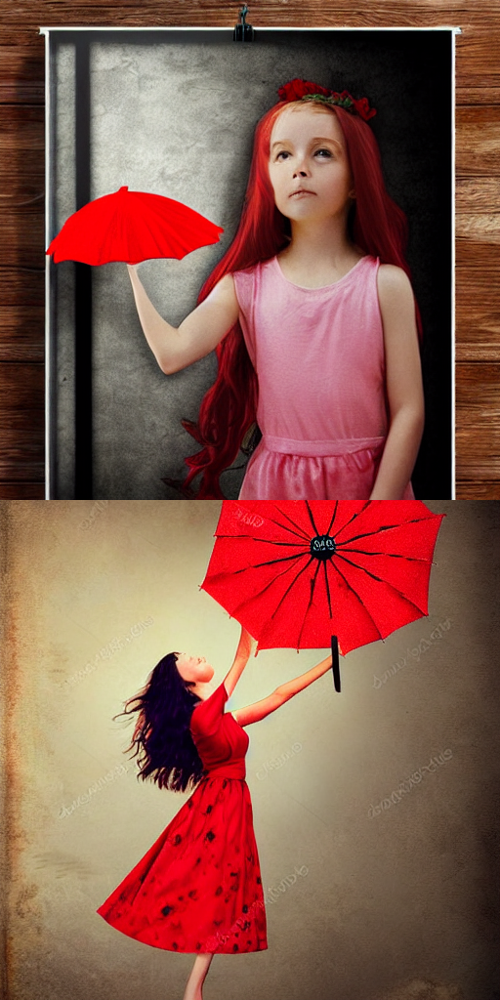

In [10]:
all_images = [] 
for _ in range(num_rows):
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5, generator=generator).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

In [11]:
prompt_template = "A cinematic hand made wall poster of girl with umbrella and red <TBD>"

In [ ]:
all_images = [] 
i = 1
for library in concept_libraries:
    # pipe = get_stable_diffusion_pipe()
    generator = torch.Generator(device="cuda").manual_seed(SEED * i)
    i = i + 1

    # pipe.load_textual_inversion("sd-concepts-library/cat-toy")
    replacement_prompt_word = library.split("/")[1]
    prompt = prompt_template.replace("TBD", replacement_prompt_word)
    pipe.load_textual_inversion(library)
    print(prompt)
    for _ in range(num_rows):
        images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5, generator=generator).images
        all_images.extend(images)

A cinematic hand made wall poster of girl with umbrella and red <birb-style>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <line-art>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <poolrooms>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <midjourney-style>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <depthmap>


  0%|          | 0/50 [00:00<?, ?it/s]

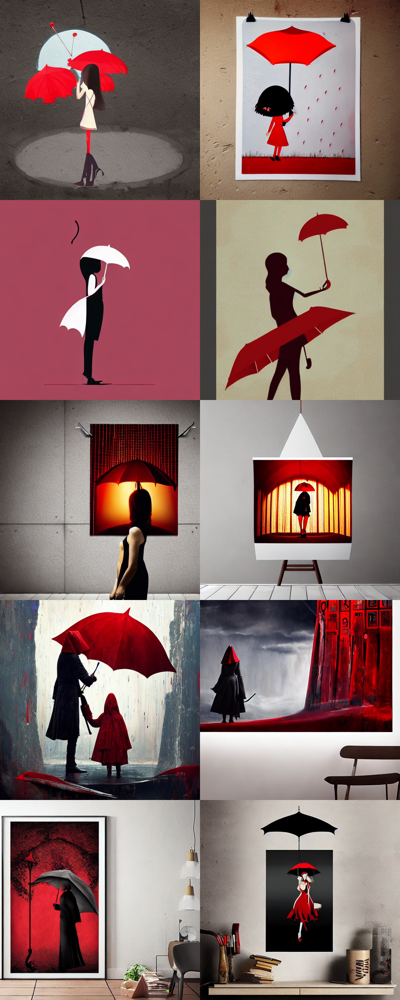

In [ ]:
grid = image_grid(all_images, rows=len(concept_libraries))
grid

In [ ]:
# from PIL import Image
# import numpy as np
# import matplotlib.pyplot as plt
# image_arrays = [np.array(img) for img in all_images]
# fig, axes = plt.subplots(nrows=10, figsize=(20, 100))
# for ax, img in zip(axes, image_arrays):
#     ax.imshow(img)
#     ax.axis('off')
# plt.show()

# Generating images again based on same downloaded embeddings

In [41]:
from transformers.modeling_attn_mask_utils import _create_4d_causal_attention_mask
from tqdm.auto import tqdm

In [37]:
# Prep Scheduler
def set_timesteps(scheduler, num_inference_steps):
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32) # minor fix to ensure MPS compatibility, fixed in diffusers PR 3925


In [49]:
def latents_to_pil(latents, vae):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [13]:
# Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device)

In [14]:
prompt = 'flower'
tokens = tokenizer(prompt)
print('tokenizer(prompt):', tokens)

SELECTED_TOKEN = tokens["input_ids"][1]
print(SELECTED_TOKEN)

tokenizer(prompt): {'input_ids': [49406, 4055, 49407], 'attention_mask': [1, 1, 1]}
4055


In [15]:
pos_emb_layer = text_encoder.text_model.embeddings.position_embedding
pos_emb_layer

Embedding(77, 768)

In [16]:
token_emb_layer = text_encoder.text_model.embeddings.token_embedding
token_emb_layer # Vocab size 49408, emb_dim 768

Embedding(49408, 768)

In [45]:
def generate_with_embs(text_embeddings, generator, text_input_max_length):
    height = 512                        # default height of Stable Diffusion
    width = 512                         # default width of Stable Diffusion
    num_inference_steps = 30            # Number of denoising steps
    guidance_scale = 7.5                # Scale for classifier-free guidance
    batch_size = 1

    uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=text_input_max_length, return_tensors="pt"
    )
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # Prep Scheduler
    set_timesteps(scheduler, num_inference_steps)

    # Prep latents
    latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    )
    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    # Loop
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

    return latents

In [39]:
def get_output_embeds(input_embeddings):
    # CLIP's text model uses causal mask, so we prepare it here:
    bsz, seq_len = input_embeddings.shape[:2]
    causal_attention_mask = _create_4d_causal_attention_mask((bsz, seq_len), dtype=input_embeddings.dtype, device=torch_device)

    # Getting the output embeddings involves calling the model with passing output_hidden_states=True
    # so that it doesn't just return the pooled final predictions:
    encoder_outputs = text_encoder.text_model.encoder(
        inputs_embeds=input_embeddings,
        attention_mask=None, # We aren't using an attention mask so that can be None
        causal_attention_mask=causal_attention_mask.to(torch_device),
        output_attentions=None,
        output_hidden_states=True, # We want the output embs not the final output
        return_dict=None,
    )

    # We're interested in the output hidden state only
    output = encoder_outputs[0]

    # There is a final layer norm we need to pass these through
    output = text_encoder.text_model.final_layer_norm(output)

    # And now they're ready!
    return output

In [25]:
position_ids = text_encoder.text_model.embeddings.position_ids[:, :77]
position_embeddings = pos_emb_layer(position_ids)
print(position_embeddings.shape)

torch.Size([1, 77, 768])


In [26]:
prompt = "A cinematic hand made wall poster of girl with umbrella and red flower"
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)
token_embeddings = token_emb_layer(input_ids)
# Only printing first 20 tokens
print('tokenizer(prompt):', input_ids[0][:20], input_ids[0].shape)
## Flower token = 4055

tokenizer(prompt): tensor([49406,   320, 25602,  2463,  1105,  2569,  3574,   539,  1611,   593,
        17143,   537,   736,  4055, 49407, 49407, 49407, 49407, 49407, 49407],
       device='cuda:0') torch.Size([77])


In [53]:
i = 1
embedding_directory = "embeddings"
all_images = [] 
for library in concept_libraries:

    # Here generator is set for CPU

    generator = torch.Generator(device="cpu").manual_seed(SEED * i)
    i = i + 1

    # pipe.load_textual_inversion("sd-concepts-library/cat-toy")
    replacement_prompt_word = library.split("/")[1]

    embeddings = torch.load(os.path.join(os.getcwd(), embedding_directory, replacement_prompt_word + "-learned_embeds.bin"))
    
    print(list(embeddings.keys()) ,len(embeddings[list(embeddings.keys())[0]]))
    replacement_token_embedding = embeddings[list(embeddings.keys())[0]].to(torch_device)
    token_embeddings[0, torch.where(input_ids[0]==SELECTED_TOKEN)] = replacement_token_embedding.to(torch_device)
    # Combine with pos embs
    input_embeddings = token_embeddings + position_embeddings
    #  Feed through to get final output embs
    modified_output_embeddings = get_output_embeds(input_embeddings)
    latents = generate_with_embs(modified_output_embeddings, generator,  text_input.input_ids.shape[-1])

    print(latents.shape)
    all_images.append(latents_to_pil(latents, vae)[0])


['<birb-style>'] 768


C:\Users\1430647\AppData\Local\Temp\1\ipykernel_30832\4030789402.py:21: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([1, 4, 64, 64])
['<line-art>'] 768


  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([1, 4, 64, 64])
['<poolrooms>'] 768


  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([1, 4, 64, 64])
['<midjourney-style>'] 768


  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([1, 4, 64, 64])
['<depthmap>'] 768


  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([1, 4, 64, 64])


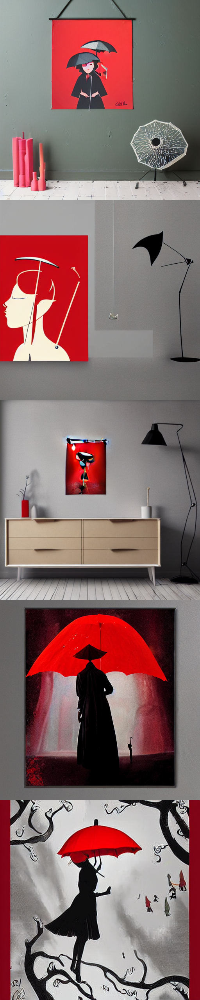

In [54]:
grid = image_grid(all_images, rows=len(concept_libraries))
grid